# Decision Tree with MAGIC Gamma-Ray Telescope Data

In this guide, you will learn how to implement a Decision Tree and a Random Forest machine learning techniques to classify MAGIC Gamma-Ray Telescope simulated events using scikit-learn. 

There are two types of events in MAGIC telescope data, gamma rays (g) and cosmic-ray hadrons (h). Gamma rays are the signal that telescopes like MAGIC search for, while cosmic-ray hadrons are the background with a rate much higher than the gamma rays. The images from signal gamma rays and background hadrons possess different signatures, with gamma-ray events looking slim and clean, while hadronic events look wide and messy. 

The goal of the machine learning model is to optimize event classification and achive an ideal gamma-ray detection sensitivity. 

The specific model, Decision Tree and Random Forest, can be easily replaced with other models. 

This notebook is adapted from Akhilesh Thite's notebook: https://www.kaggle.com/akhileshthite/magic-gamma-telescope-random-forest-99-98/notebook 

The data are from https://www.kaggle.com/abhinand05/magic-gamma-telescope-dataset, where more information can be found. 

The original owner of data:
R. K. Bock
Major Atmospheric Gamma Imaging Cherenkov Telescope project (MAGIC)
http://wwwmagic.mppmu.mpg.de
rkb '@' mail.cern.ch

Columns in data file: 

- Index of each data point.

- fLength: major axis of ellipse [mm]

- fWidth: minor axis of ellipse [mm]

- fSize: 10-log of sum of content of all pixels [in #phot]

- fConc: ratio of sum of two highest pixels over fSize [ratio]

- fConc1: ratio of highest pixel over fSize [ratio]

- fAsym: distance from highest pixel to center, projected onto major axis [mm]

- fM3Long: 3rd root of third moment along major axis (This is a measure of skewness) [mm]

- fM3Trans: 3rd root of third moment along minor axis [mm]

- fAlpha: angle of major axis with vector to origin [deg]

- fDist: distance from origin to center of ellipse [mm]

- class: gamma (signal), hadron (background)



## Steps

In this guide, we will follow the following steps:

* Step 1 - Importing the required libraries and modules.

* Step 2 - Loading the dataset and performing basic data checks.

* Step 3 - Exploring and visualising the dataset 

* Step 4 - Preparing the input feature variables (label encoding, train / test split)

* Step 5 - Training and evaluating a Decision Tree classification model.

* Step 6 - Training and evaluating a Random Forest classification model.


## Step 1 - Importing the required libraries and modules.


In [1]:
# not important: disable matplotlib warning for a cleaner look
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

# data IO
import pandas as pd

# data exploring / checking
import pandas_profiling as pp


%matplotlib inline
# plotting
import matplotlib.pyplot as plt
import seaborn as sns

# standard for vectorized computing
import numpy as np


# scikit-learn for machine learning
import sklearn

# encoding dependent data (output label to 1 and 0)
from sklearn.preprocessing import LabelEncoder

# train/test split
from sklearn.model_selection import train_test_split

# Decision Tree classifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text


# Random Forest classifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import model_selection

# Model evaluation
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score, plot_confusion_matrix


## Step 2 - Loading the dataset and performing basic data checks.


In [2]:
# Define path to file (you may need to change this to match your system)
input_file = "telescope_data.csv"

# Load the file using pandas; the first column is just index
df = pd.read_csv(input_file, index_col=0)

# Display the data
df


,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,h
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,h
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,h
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,h


### Dataset information (Pandas Profiling)

In [3]:
pp.ProfileReport(df, title = 'Pandas Profiling report of MAGIC Kaggle dataset', 
                 html = {'style':{'full_width': True}})

## Step 3 - Exploring and visualising the dataset 


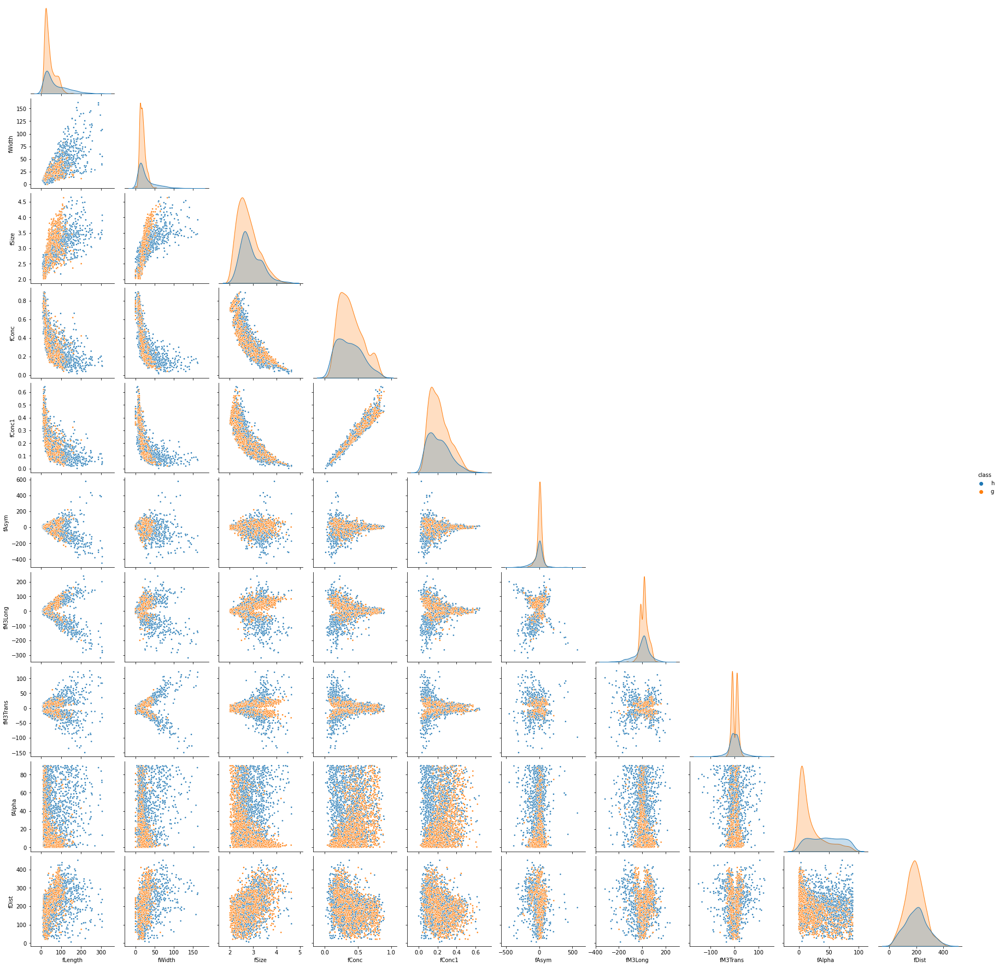

In [4]:
# randomly sample 20% data to view correlations and distributions
sns.pairplot(data=df.sample(frac=0.2), hue='class', corner=True, markers='.') 


# Important: understand your data
* Input data contains:
 * a simulated point source of gamma rays
 * diffuse background of hadrons

### We know fAlpha is correlated with where the event comes from
* fAlpha is the "answer" to the question of is there a gamma-ray point source
* For single-telescope data, we rely on fAlpha for scientific discovery

* fAlpha is clustered in this dataset because the signal is simulated as a point source
* This information is generally not known a priori in real data 
* We should not use fAlpha for event classification, to avoid using the "answer" to make prediction


In [5]:
df = df.drop(columns=['fAlpha'])


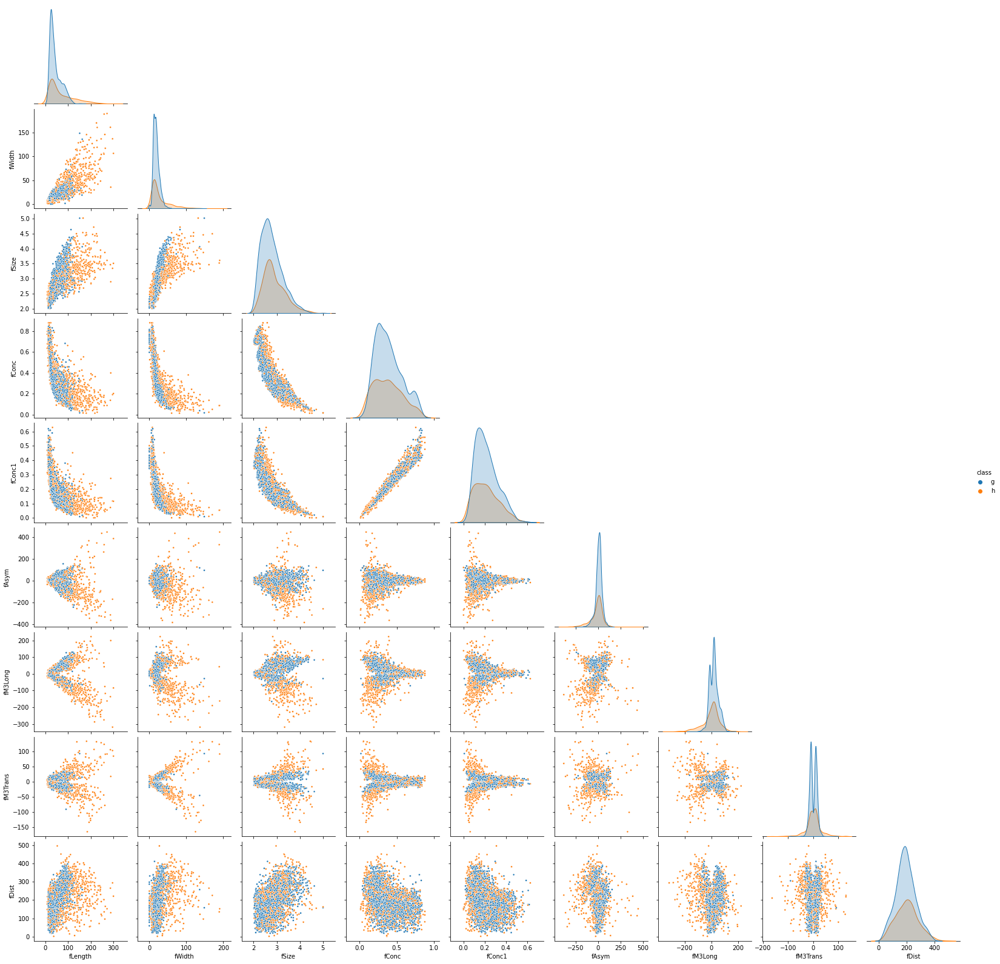

In [6]:
sns.pairplot(data=df.sample(frac=0.2), hue='class', corner=True, markers='.') 


## Step 4 - Preparing the input feature variables (label encoding, train / test split)


In [7]:
# the first 10 columns are the input features; these are image parameters measured by the telescope
X = df.iloc[:, 0:-1].values
# label signal / background class
y = df.iloc[:, -1].values

# Encode text label into numeric (binary), 0 for gamma and 1 for hadron
le = LabelEncoder()
y = le.fit_transform(y)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)


In [9]:
### other tricks you can do: feature scaling


## Step 5 - Training and evaluating a Decision Tree classification model


In [10]:
classifier = DecisionTreeClassifier(max_depth=12)

classifier.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=12)

### Predicting a new result

In [11]:
print(classifier.predict( X_train[1:2] ))

[0]


### Check training performance, use confusion matrix and accuracy for evaluation

Training accuracy: 86.57%


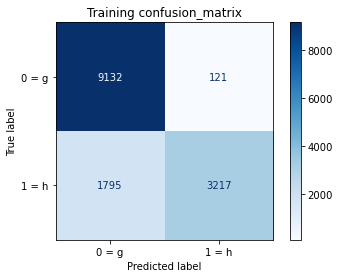

In [12]:
y_trained = classifier.predict(X_train)
#print(classification_report(y_train, y_trained))
# confusion_matrix
plot_confusion_matrix(classifier, X_train, y_train,
                      display_labels=['0 = g' , '1 = h'],
                      cmap=plt.cm.Blues, 
                      normalize=None)
plt.title("Training confusion_matrix")

print("Training accuracy: {:.2f}%".format(accuracy_score(y_train, y_trained)*100))



### Predicting the test set results

In [13]:
y_pred = classifier.predict(X_test)

### Check test performance,  use confusion matrix and accuracy for evaluation

Test accuracy: 79.92%


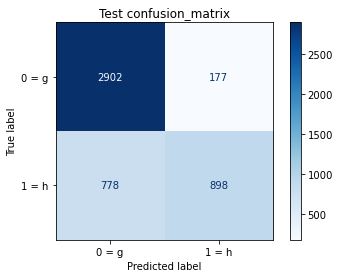

In [14]:
plot_confusion_matrix(classifier, X_test, y_test,
              display_labels=['0 = g' , '1 = h'],
              cmap=plt.cm.Blues,
              normalize=None)
plt.title("Test confusion_matrix")
print("Test accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred)*100))

### Understanding what the model is doing

Feature ranking:
1. feature 0 fLength (0.303399)
2. feature 2 fSize (0.211330)
3. feature 1 fWidth (0.195207)
4. feature 6 fM3Long (0.083472)
5. feature 3 fConc (0.057910)
6. feature 8 fDist (0.054004)
7. feature 7 fM3Trans (0.033343)
8. feature 4 fConc1 (0.032009)
9. feature 5 fAsym (0.029327)


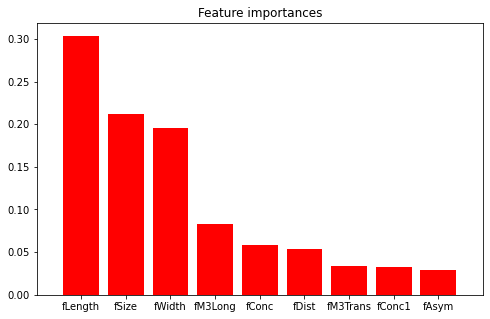

In [15]:
# feature importance
importances = classifier.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

tick_names = []

for f in range(X.shape[1]):
    print("%d. feature %d %s (%f)" % (f + 1, indices[f], df.columns[indices[f]], importances[indices[f]]))
    tick_names.append(df.columns[indices[f]])

# Plot the impurity-based feature importances of the forest
plt.figure(figsize=(8,5))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
        color="r")#, yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), tick_names)


plt.xlim([-1, X.shape[1]])
plt.show()


In [16]:
df.columns[:-1]

Index(['fLength', 'fWidth', 'fSize', 'fConc', 'fConc1', 'fAsym', 'fM3Long',
       'fM3Trans', 'fDist'],
      dtype='object')

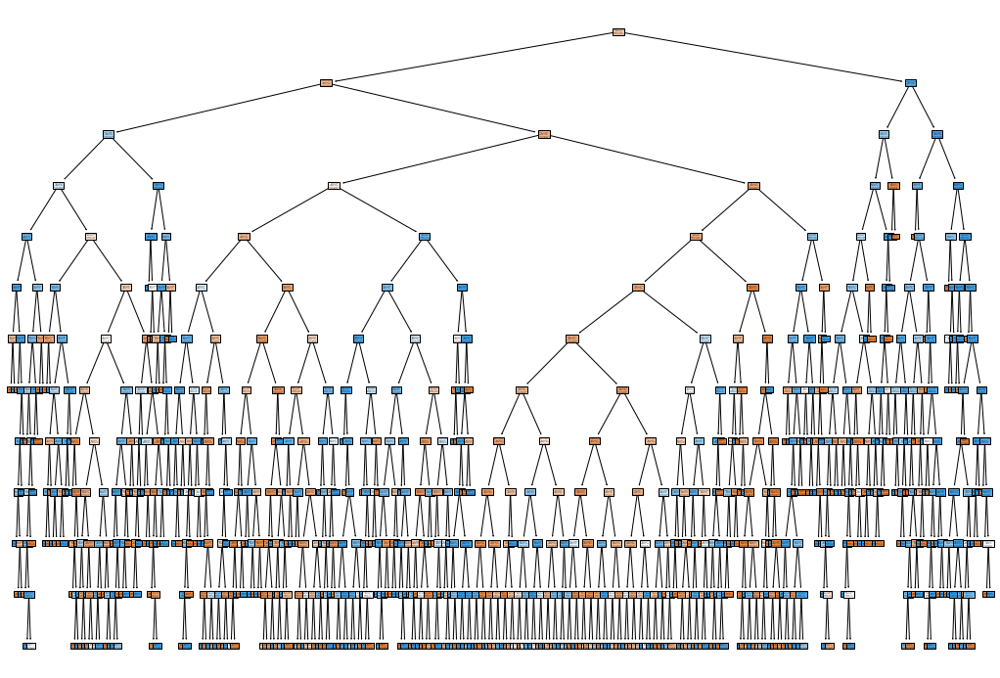

In [25]:
plt.figure(figsize=(18,12.5))
tree.plot_tree(classifier, feature_names=df.columns[:-1], class_names = ['gamma', 'hadron'], filled=True); 


### Test performance is much worse than training performance: <font color='red'> overtrained </font> 

* max_depth: int, default=None

 The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

* We don't want trees that too deep, as it's easy to overfit; we certainly don't want pure leaves as that would be memorizing data, leading to an extreme overtraining

* Regularize the decision tree depth: try to use a shallower tree

### making a function to repeat what we did above

In [26]:

def train_dt(show_plots=True, **kwargs): 
    # one line to change to an entire new model: 
    classifier = DecisionTreeClassifier( **kwargs)
    
    classifier.fit(X_train, y_train)
    y_trained = classifier.predict(X_train)
    print("================ training performance ================")
    print(classification_report(y_train, y_trained))
    
    y_pred = classifier.predict(X_test)
    print("================ test performance ================")
    print(classification_report(y_test, y_pred))
    
    if show_plots: 
        # confusion_matrix
        plot_confusion_matrix(classifier, X_train, y_train,
                              display_labels=['0 = g' , '1 = h'],
                              cmap=plt.cm.Blues, 
                              normalize=None)
        plt.title("Training confusion_matrix")

        print("Training accuracy: {:.2f}%".format(accuracy_score(y_train, y_trained)*100))

        plot_confusion_matrix(classifier, X_test, y_test,
                      display_labels=['0 = g' , '1 = h'],
                      cmap=plt.cm.Blues,
                      normalize=None)
        plt.title("Test confusion_matrix")
        print("Test accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred)*100))
        
        # feature importance
        importances = classifier.feature_importances_
        indices = np.argsort(importances)[::-1]

        # print/plot the feature ranking
        print("Feature ranking:")

        tick_names = []

        for f in range(X.shape[1]):
            print("%d. feature %d %s (%f)" % (f + 1, indices[f], df.columns[indices[f]], importances[indices[f]]))
            tick_names.append(df.columns[indices[f]])

        # plot the impurity-based feature importances of the forest
        plt.figure(figsize=(8,5))
        plt.title("Feature importances")
        plt.bar(range(X.shape[1]), importances[indices],
                color="r")#, yerr=std[indices], align="center")
        plt.xticks(range(X.shape[1]), tick_names)


        plt.xlim([-1, X.shape[1]])
        plt.show()
        
        # plot the tree
        plt.figure(figsize=(18,12.5))
        tree.plot_tree(classifier, feature_names=df.columns[:-1], class_names = ['gamma', 'hadron'], filled=True); 


    return classifier



================ training performance ================
              precision    recall  f1-score   support

           0       0.72      0.96      0.82      9253
           1       0.81      0.32      0.45      5012

    accuracy                           0.73     14265
   macro avg       0.76      0.64      0.64     14265
weighted avg       0.75      0.73      0.69     14265

================ test performance ================
              precision    recall  f1-score   support

           0       0.72      0.96      0.82      3079
           1       0.81      0.30      0.44      1676

    accuracy                           0.73      4755
   macro avg       0.76      0.63      0.63      4755
weighted avg       0.75      0.73      0.69      4755

Training accuracy: 73.32%
Test accuracy: 73.00%
Feature ranking:
1. feature 0 fLength (0.848983)
2. feature 6 fM3Long (0.151017)
3. feature 8 fDist (0.000000)
4. feature 7 fM3Trans (0.000000)
5. feature 5 fAsym (0.000000)
6. feature 4 fConc

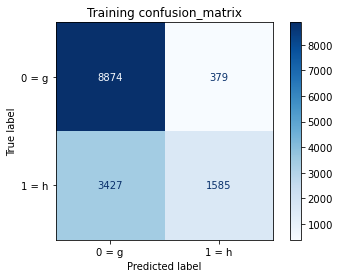

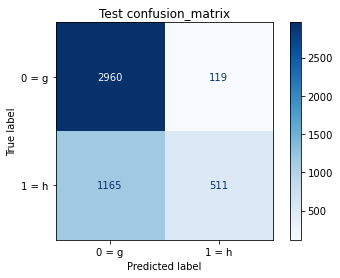

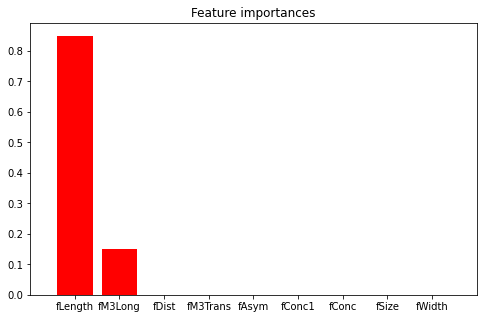

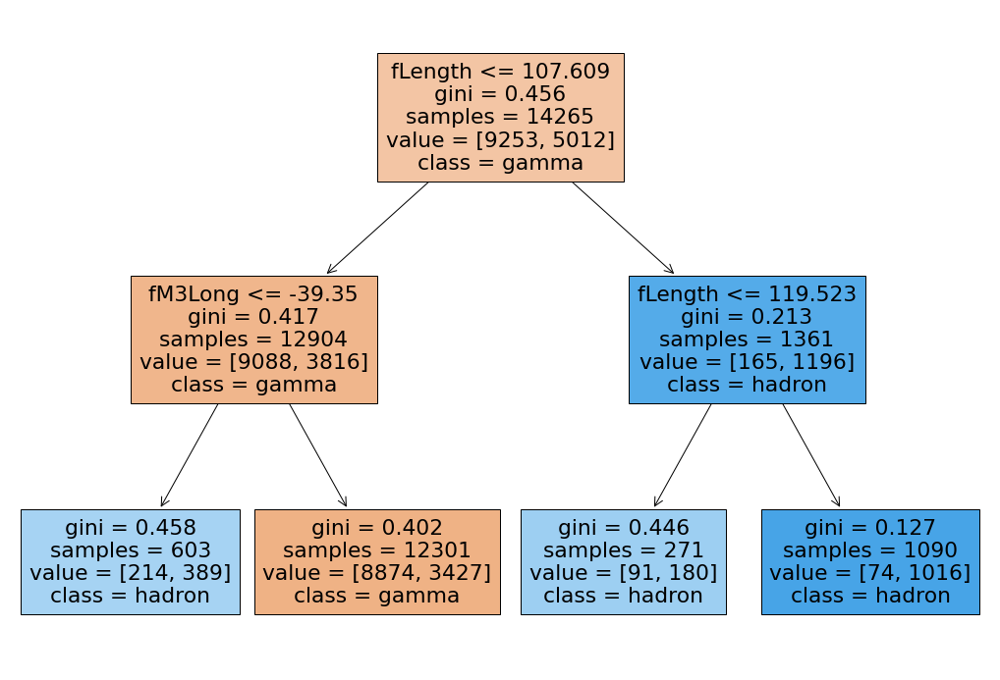

In [27]:
classifier_depth2 = train_dt(max_depth=2)



================ training performance ================
              precision    recall  f1-score   support

           0       0.72      0.96      0.82      9253
           1       0.82      0.32      0.46      5012

    accuracy                           0.73     14265
   macro avg       0.77      0.64      0.64     14265
weighted avg       0.76      0.73      0.69     14265

================ test performance ================
              precision    recall  f1-score   support

           0       0.72      0.96      0.82      3079
           1       0.82      0.30      0.44      1676

    accuracy                           0.73      4755
   macro avg       0.77      0.63      0.63      4755
weighted avg       0.75      0.73      0.69      4755

Training accuracy: 73.47%
Test accuracy: 73.14%
Feature ranking:
1. feature 0 fLength (0.686568)
2. feature 1 fWidth (0.175616)
3. feature 6 fM3Long (0.122127)
4. feature 2 fSize (0.015688)
5. feature 8 fDist (0.000000)
6. feature 7 fM3Tran

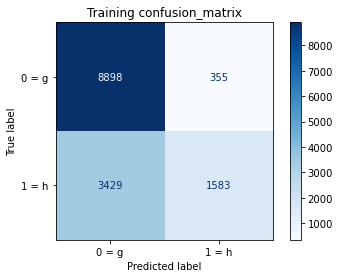

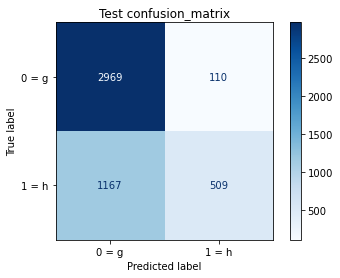

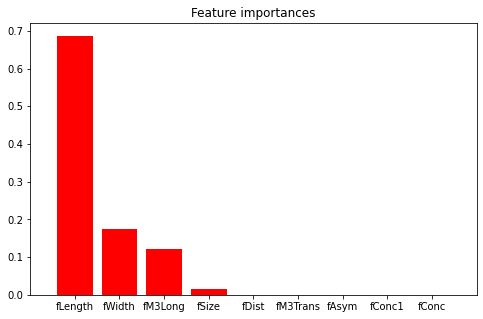

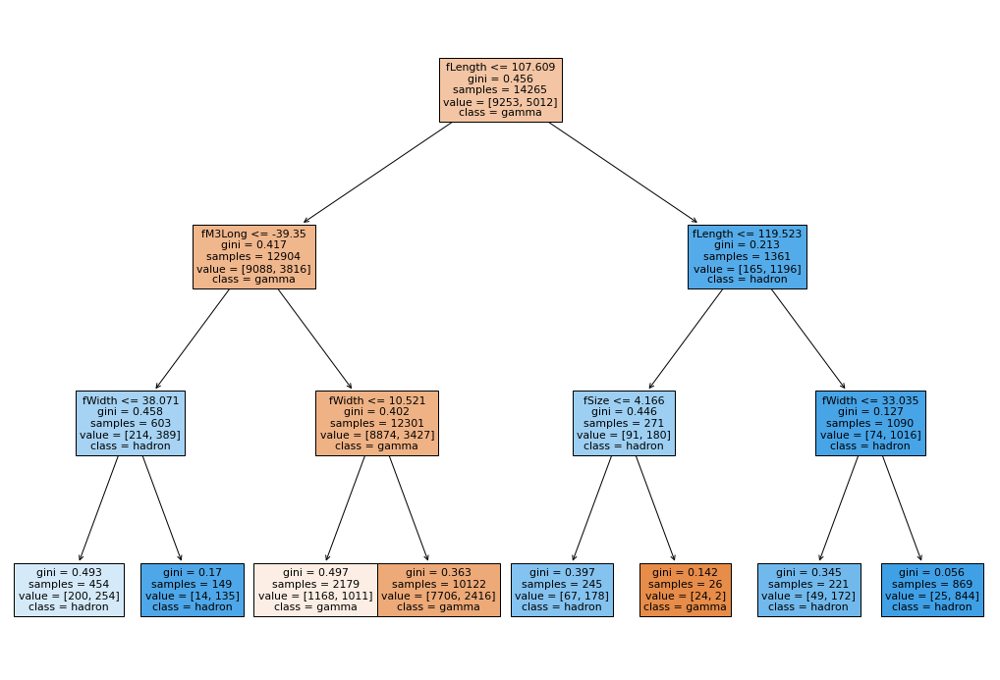

In [28]:
classifier_depth3 = train_dt(max_depth=3)

## Step 6 - Training and evaluating a Random Forest classification model.


In [22]:
def train_rf(show_plots=True, **kwargs): 
    classifier = RandomForestClassifier(**kwargs)
    classifier.fit(X_train, y_train)
    y_trained = classifier.predict(X_train)
    print("================ training performance ================")
    print(classification_report(y_train, y_trained))
    
    y_pred = classifier.predict(X_test)
    print("================ test performance ================")
    print(classification_report(y_test, y_pred))
    
    if show_plots: 
        # confusion_matrix
        plot_confusion_matrix(classifier, X_train, y_train,
                              display_labels=['0 = g' , '1 = h'],
                              cmap=plt.cm.Blues, 
                              normalize=None)
        plt.title("Training confusion_matrix")

        print("Training accuracy: {:.2f}%".format(accuracy_score(y_train, y_trained)*100))

        plot_confusion_matrix(classifier, X_test, y_test,
                      display_labels=['0 = g' , '1 = h'],
                      cmap=plt.cm.Blues,
                      normalize=None)
        plt.title("Test confusion_matrix")
        print("Test accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred)*100))
        
        # feature importance
        importances = classifier.feature_importances_
        std = np.std([tree.feature_importances_ for tree in classifier.estimators_],
                     axis=0)
        indices = np.argsort(importances)[::-1]

        # Print the feature ranking
        print("Feature ranking:")

        tick_names = []

        for f in range(X.shape[1]):
            print("%d. feature %d %s (%f)" % (f + 1, indices[f], df.columns[indices[f]], importances[indices[f]]))
            tick_names.append(df.columns[indices[f]])

        # Plot the impurity-based feature importances of the forest
        plt.figure(figsize=(8,5))
        plt.title("Feature importances")
        plt.bar(range(X.shape[1]), importances[indices],
                color="r", yerr=std[indices], align="center")
        plt.xticks(range(X.shape[1]), tick_names)


        plt.xlim([-1, X.shape[1]])
        plt.show()

    return classifier



================ training performance ================
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9253
           1       1.00      1.00      1.00      5012

    accuracy                           1.00     14265
   macro avg       1.00      1.00      1.00     14265
weighted avg       1.00      1.00      1.00     14265

================ test performance ================
              precision    recall  f1-score   support

           0       0.83      0.94      0.88      3079
           1       0.85      0.66      0.74      1676

    accuracy                           0.84      4755
   macro avg       0.84      0.80      0.81      4755
weighted avg       0.84      0.84      0.83      4755

Training accuracy: 100.00%
Test accuracy: 83.89%
Feature ranking:
1. feature 1 fWidth (0.178707)
2. feature 0 fLength (0.168980)
3. feature 2 fSize (0.136497)
4. feature 6 fM3Long (0.116356)
5. feature 3 fConc (0.086108)
6. feature 8 fDist 

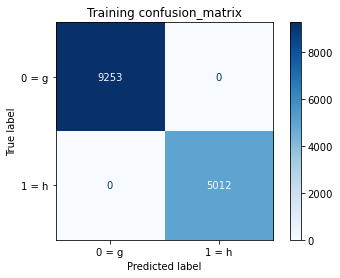

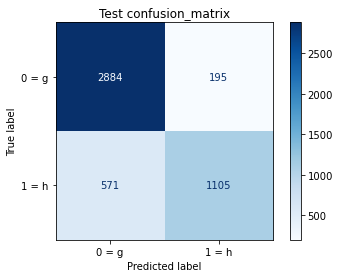

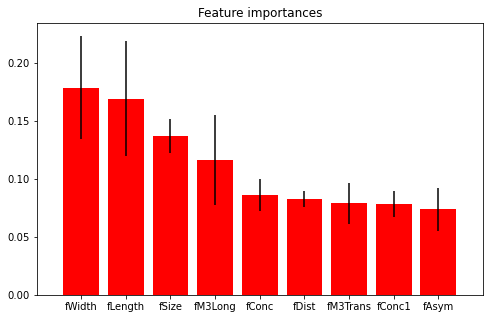

In [23]:
rf_classfier_overtrain = train_rf(n_estimators = 100)

# overtrained; need to regularize the model

* try to constrain the depth of the trees

================ training performance ================
              precision    recall  f1-score   support

           0       0.74      0.98      0.84      9253
           1       0.90      0.36      0.51      5012

    accuracy                           0.76     14265
   macro avg       0.82      0.67      0.68     14265
weighted avg       0.80      0.76      0.73     14265

================ test performance ================
              precision    recall  f1-score   support

           0       0.73      0.98      0.84      3079
           1       0.90      0.34      0.49      1676

    accuracy                           0.75      4755
   macro avg       0.82      0.66      0.67      4755
weighted avg       0.79      0.75      0.72      4755

Training accuracy: 76.05%
Test accuracy: 75.44%
Feature ranking:
1. feature 0 fLength (0.296793)
2. feature 1 fWidth (0.270604)
3. feature 6 fM3Long (0.181274)
4. feature 2 fSize (0.085995)
5. feature 7 fM3Trans (0.073240)
6. feature 3 fCon

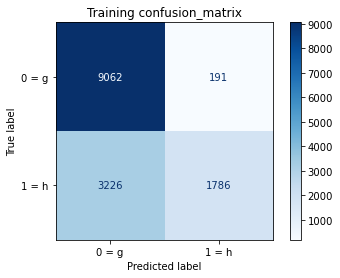

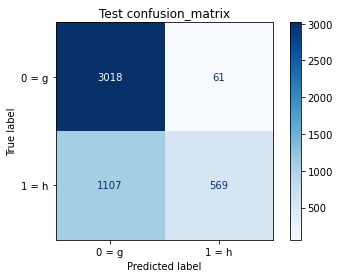

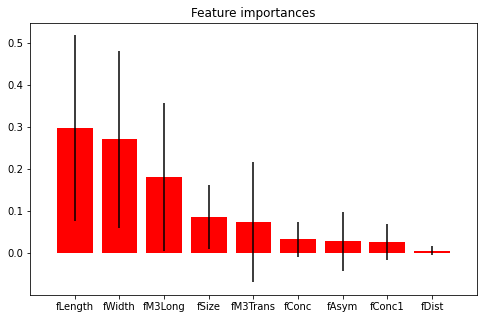

In [31]:
rf_maxdepth4 = train_rf(n_estimators = 100, criterion = 'entropy', 
                        max_depth=4)